# Using change of variables $Z = k_0 n_0 \sin \Psi$

This is outlined in Snyder Optical Waveguide theory pg 537.  Here we want to see where the zeroes of the eigenvalue equation end up relative to the steepest descent path.

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact
from fiberamp.fiber.microstruct.bragg import plotlogf
from IPython.display import Video

%matplotlib widget
plt.style.use('dark_background')

## Steepest descent path

In [83]:
def sdp(y):
    return np.sign(y) * np.arccos(1 / np.cosh(y))

## Basic 3 layer

In [84]:
A = SlabExact(symmetric=True, wl=5e-6)

In [85]:
det_Psi_A = lambda Psi: A.determinant_Z(A.K0*A.n0* np.sin(Psi), field_type='TE', mode_type='leaky' )

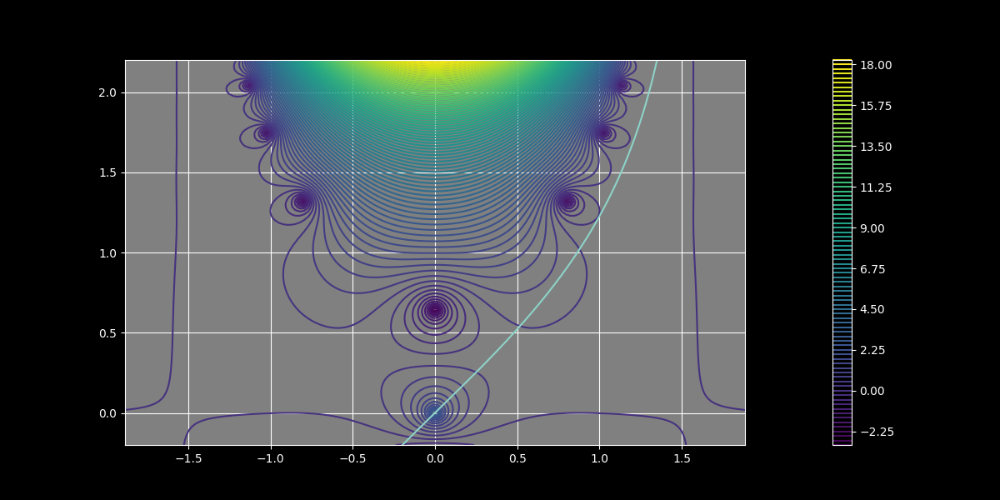

In [86]:
plotlogf(det_Psi_A, -1.2*np.pi/2, 1.2*np.pi/2, -.2, 2.2, iref=150, rref=150, levels=100)
ys = np.linspace(-.2, 2.2, 1000)
xs = sdp(ys)
plt.plot(xs,ys)

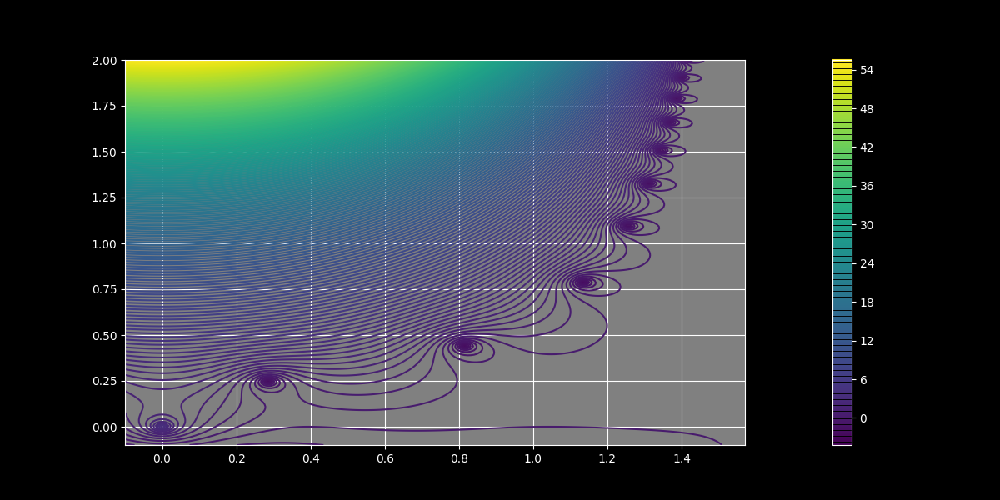

In [6]:
plotlogf(det_Psi_A, -.1, np.pi/2, -.1, 2, iref=200, rref=200, levels=200)

### Adding SDP

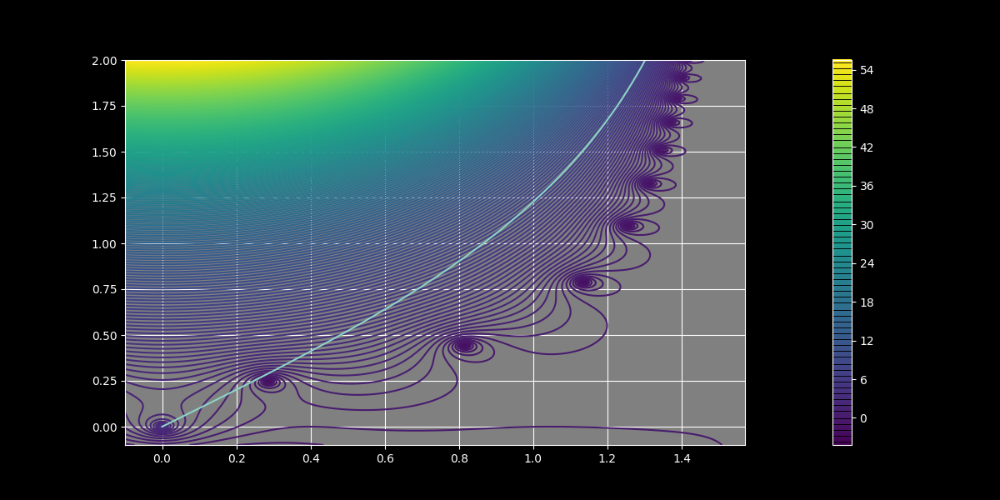

In [7]:
plotlogf(det_Psi_A, -.1, np.pi/2, -.1, 2, iref=200, rref=200, levels=200)
ys = np.linspace(0, 2, 1001)
xs = sdp(ys)
plt.plot(xs, ys);

#### Zooming in at crossing

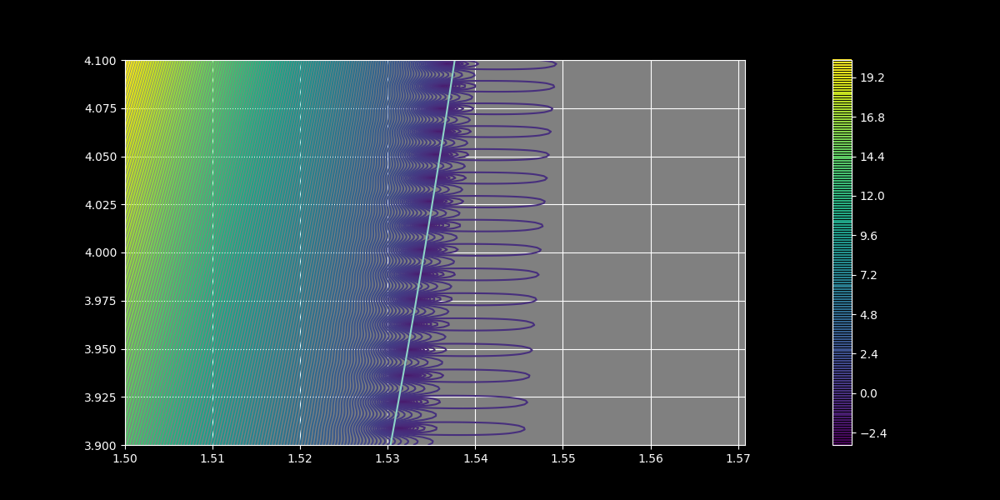

In [8]:
plotlogf(det_Psi_A, 1.5, np.pi/2, 3.9,4.1, iref=200, rref=200, levels=200)
ys = np.linspace(3.9, 4.1, 1001)
xs = sdp(ys)
plt.plot(xs, ys);

## Antiguide

In [8]:
B = SlabExact(scale=1e-6, Ts=[4, 2, 4],
              ns=[1.44, 1, 1.44], xrefs=[400, 200, 400],
              symmetric=True, wl=1e-6)

In [9]:
det_Psi_B = lambda Psi: B.determinant_Z(B.K0*B.n0* np.sin(Psi), field_type='TE', mode_type='leaky' )

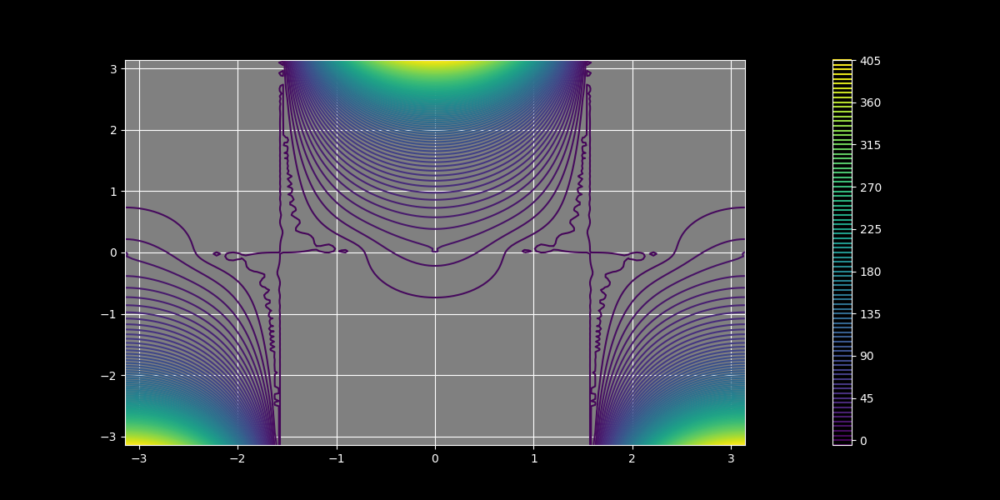

In [10]:
plotlogf(det_Psi_B, -np.pi, np.pi, -np.pi, np.pi, iref=150, rref=150, levels=100)

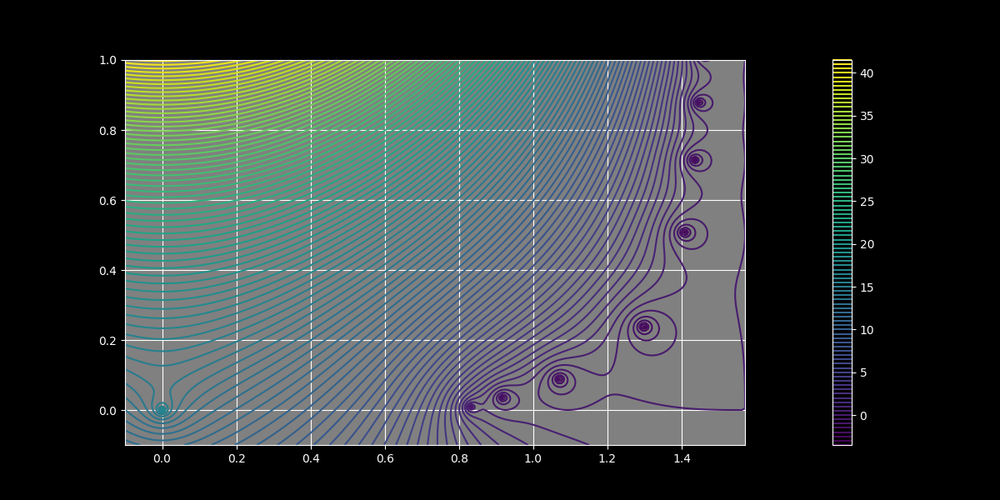

In [11]:
plotlogf(det_Psi_B, -.1, np.pi/2, -.1, 1, iref=200, rref=200, levels=100)

### Adding SDP

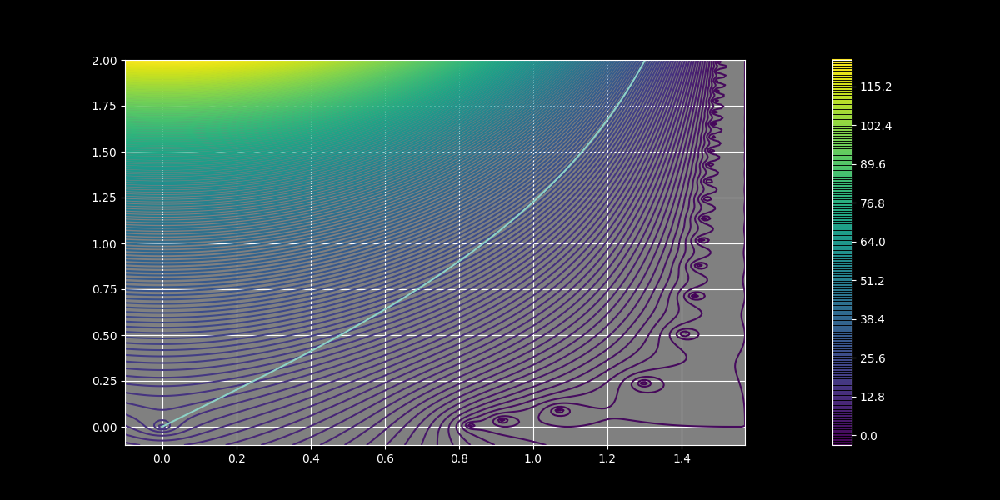

In [15]:
plotlogf(det_Psi_B, -.1, np.pi/2, -.1, 2, iref=200, rref=200, levels=200)
ys = np.linspace(0, 2, 1001)
xs = sdp(ys)
plt.plot(xs, ys);

#### Crossing is hard to find

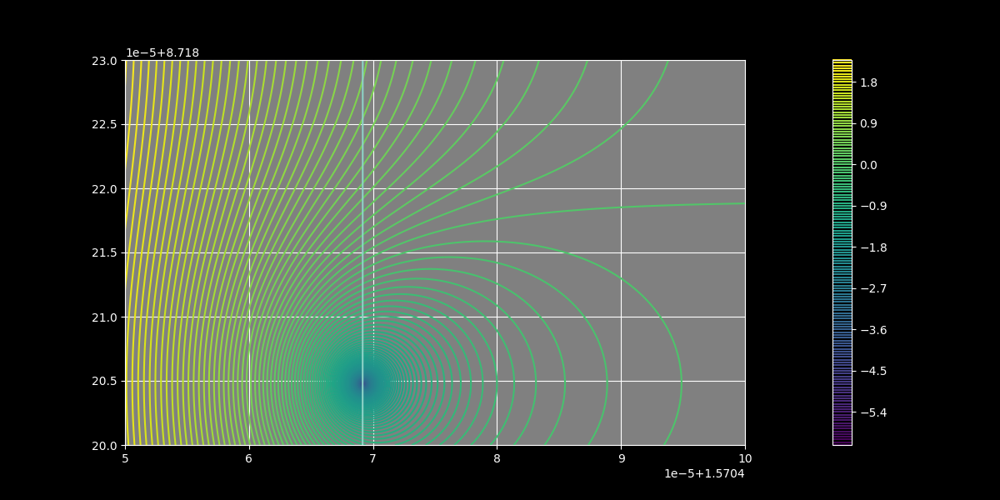

In [16]:
plotlogf(det_Psi_B, 1.57045, 1.5705, 8.7182, 8.71823, iref=700, rref=700, levels=150)
ys = np.linspace(8.7182, 8.71823, 1001)
xs = sdp(ys)
msk = np.where(xs>=1.570425)
plt.plot(xs[msk], ys[msk]);

## Hollow core guide

#### Loss minimum

In [17]:
loss_min_wl = 5.828070175438596e-06

In [18]:
D = SlabExact(scale=1e-5, Ts=[6.5, 1, 8,1, 6.5],
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[100, 40, 300, 40, 100],
              symmetric=True, wl=loss_min_wl)

In [19]:
det_Psi_D = lambda Psi: D.determinant_Z(D.K0*D.n0* np.sin(Psi), field_type='TE', mode_type='leaky' )

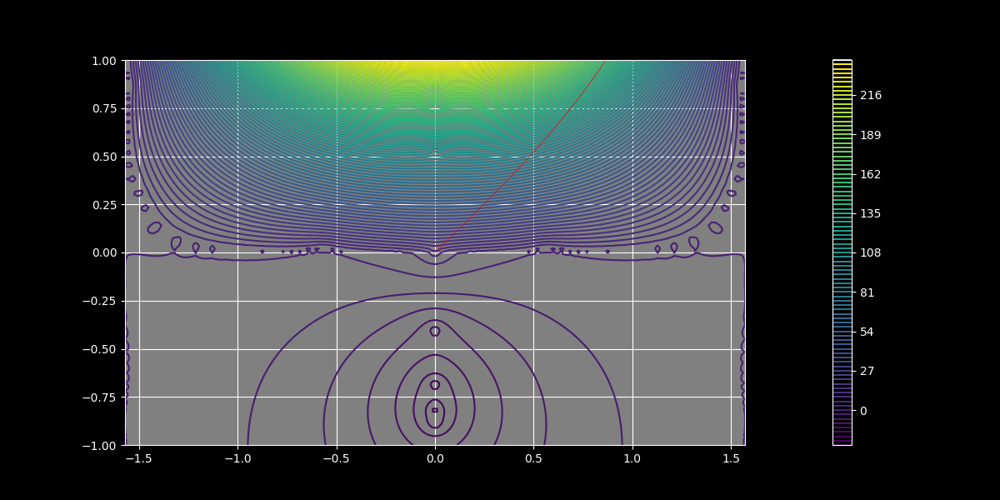

In [20]:
plotlogf(det_Psi_D, -np.pi/2, np.pi/2, -1, 1, iref=150, rref=150, levels=100)
ys = np.linspace(0, 1, 1001)
xs = sdp(ys)
plt.plot(xs, ys, 'r', lw=.5);

#### Guided modes 

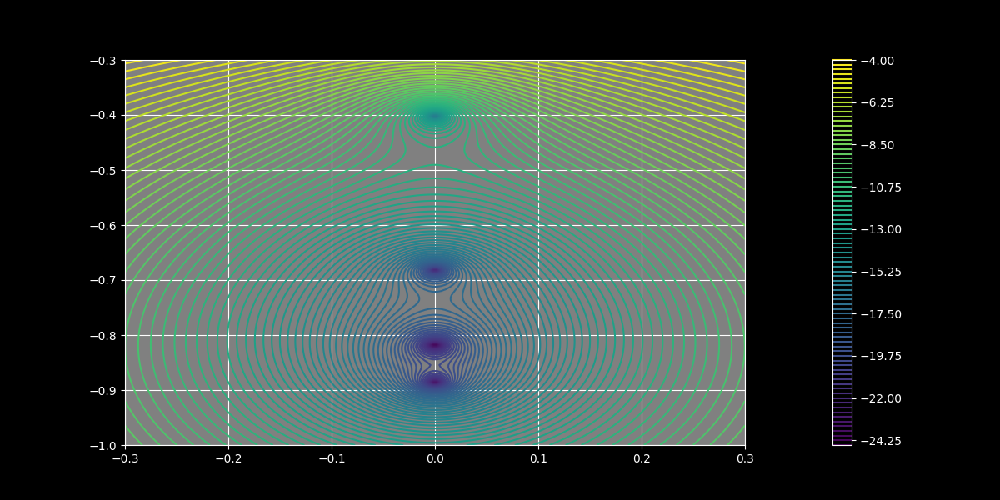

In [21]:
plotlogf(det_Psi_D, -.3, .3, -1, -.3, iref=150, rref=150, levels=100)

#### Leaky modes

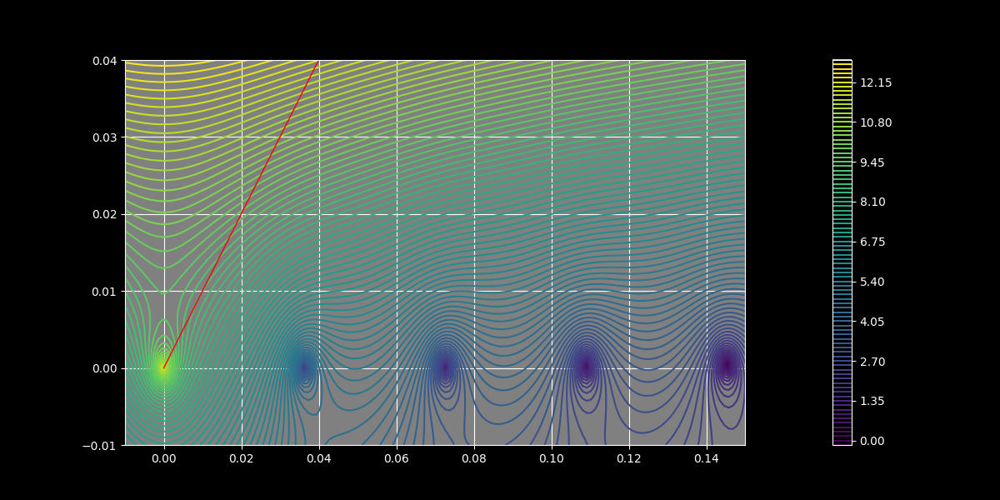

In [22]:
plotlogf(det_Psi_D, -.01, .15, -.01, .04, iref=150, rref=150, levels=100)
ys = np.linspace(0, .04, 1001)
xs = sdp(ys)
plt.plot(xs, ys, 'r', lw=1);

### Loss maximum

In [23]:
max_loss_wl = 6.90764472e-06

In [24]:
D.wl = max_loss_wl

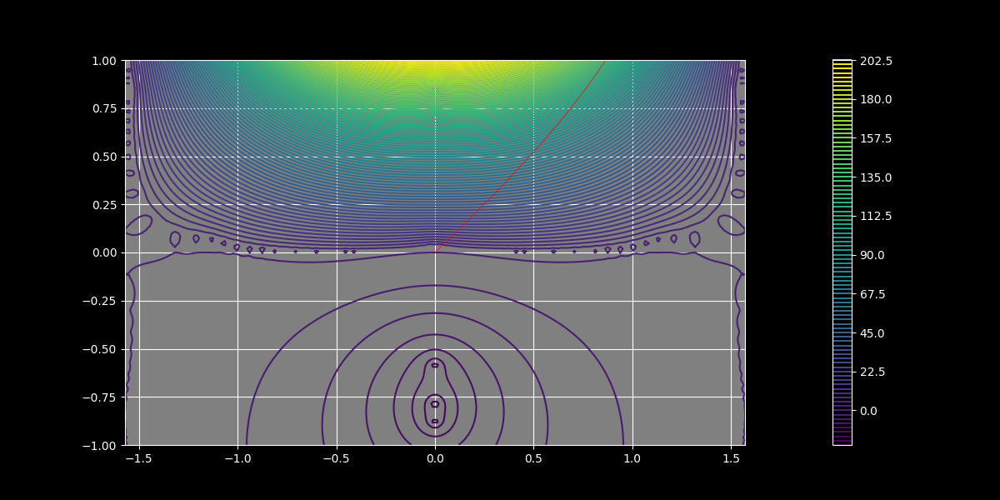

In [25]:
plotlogf(det_Psi_D, -np.pi/2, np.pi/2, -1, 1, iref=150, rref=150, levels=100)
ys = np.linspace(0, 1, 1001)
xs = sdp(ys)
plt.plot(xs, ys, 'r', lw=.5);

#### Guided modes 

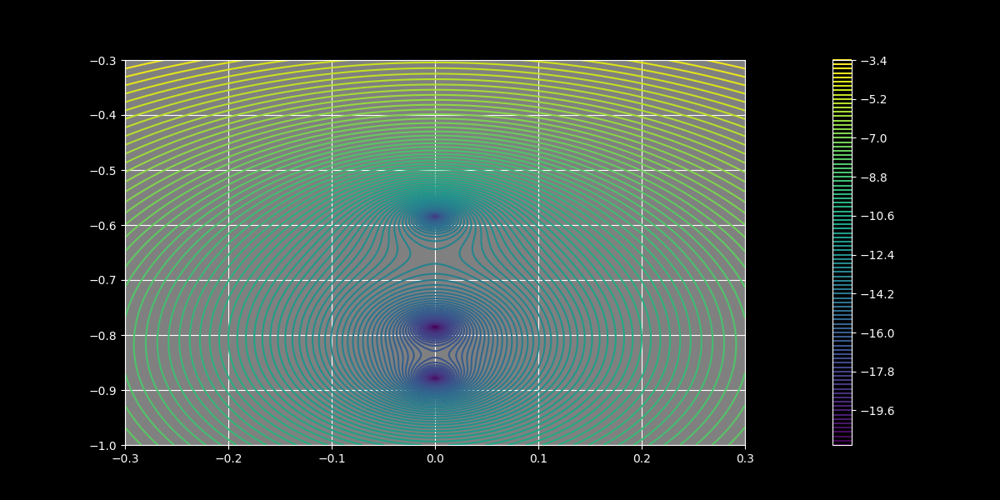

In [26]:
plotlogf(det_Psi_D, -.3, .3, -1, -.3, iref=150, rref=150, levels=100)

#### Leaky modes

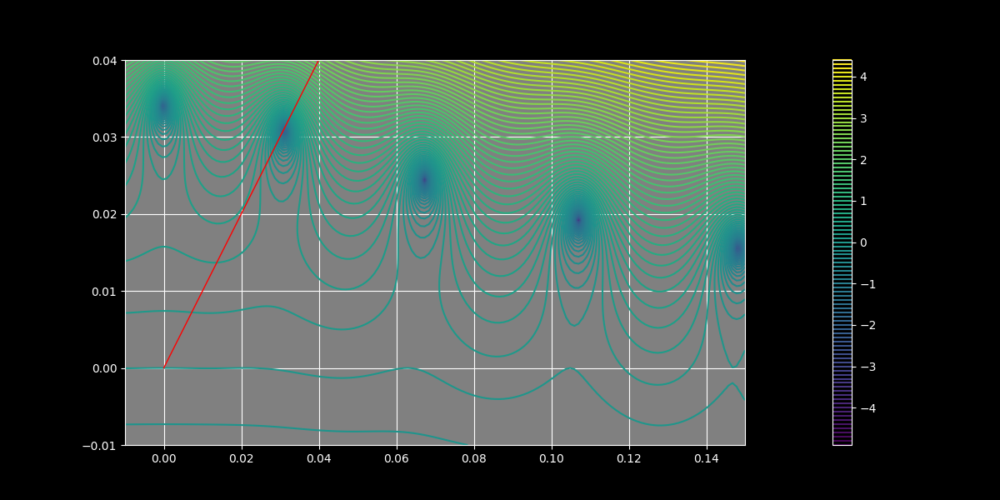

In [27]:
plotlogf(det_Psi_D, -.01, .15, -.01, .04, iref=150, rref=150, levels=100)
ys = np.linspace(0, .04, 1001)
xs = sdp(ys)
plt.plot(xs, ys, 'r', lw=1);

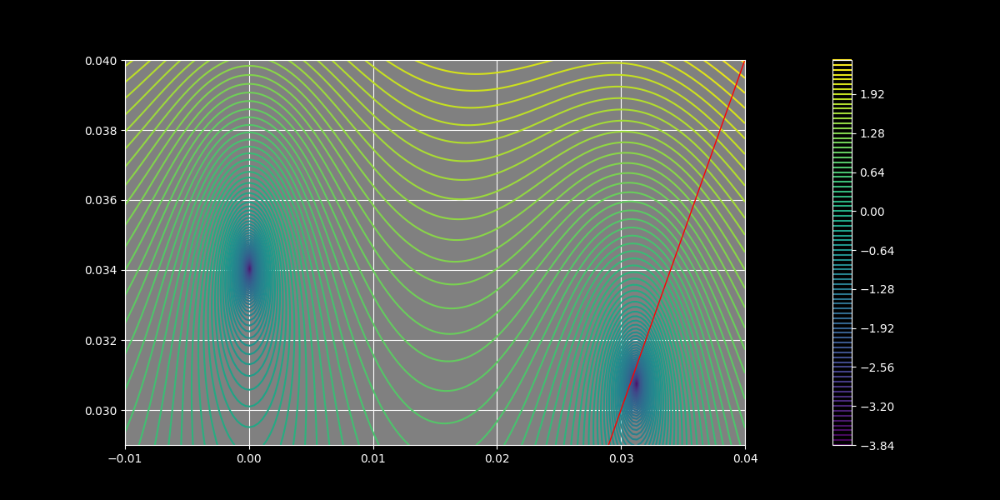

In [28]:
plotlogf(det_Psi_D, -.01, .04, .029, .04, iref=150, rref=150, levels=100)
ys = np.linspace(0.029, .04, 1001)
xs = sdp(ys)
plt.plot(xs, ys, 'r', lw=1);

# Observations

- Not really what I was expecting.  Of course, I might be wrong about the steepest descent path somehow, but I think this is at least right in the case x=0 and asymptotic in z

- I don't yet understand what the position of the leaky modes mean.  What now is loss and what is real component of associated Z?

- Definitely surprising results for the high loss hollow core wavelength.  Seems like fundamental mode isn't in part of $\Psi$ plane where it would be included in asymptotics...

# Interactive Plot

In [2]:
from ipywidgets import interactive, FloatSlider, Layout
# import matplotlib_inline.backend_inline as mplbe
# mplbe.set_matplotlib_formats('svg')


In [4]:
plt.close('all')
fig, ax = plt.subplots(1, figsize=(10,6))

xmin, xmax, xref = -.01, .15, 200
ymin, ymax, yref = -.03, .07, 200
xs, ys = np.linspace(xmin, xmax, xref), np.linspace(ymin, ymax, yref)

Xs, Ys = np.meshgrid(xs, ys)
Zs = Xs + 1j * Ys

sdp_ys = np.linspace(0, .07, 101)
sdp_xs = sdp(sdp_ys)

levels = 50

D = SlabExact(scale=1e-5, Ts=[6.5, 1, 8, 1, 6.5],
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[100, 40, 300, 40, 100], no_xs=True,
              symmetric=True)

def det_plot(wl):
    D.wl = wl
    det_Psi_D = lambda Psi: D.determinant_Z(D.K0*D.n0* np.sin(Psi), field_type='TE', mode_type='leaky' )
    ax = plt.gca()
    ax.clear()
    fs = det_Psi_D(Zs)
    data = ax.contour(Xs, Ys, np.log(np.abs(fs)), levels=levels, vmin=-4, vmax=9)
    ax.plot(sdp_xs, sdp_ys, 'r', lw=1);
    ax.grid(True)
    ax.set_facecolor('grey')
    plt.title('Current wavelength: %.6e\nResonant wavelength: 6.90764472e-06\n'%(wl), fontsize=14)
    # plt.colorbar(data)
    plt.show()

minwl, maxwl = 6.84e-6, 6.98e-6
Nwl = 495
step = (maxwl - minwl)/Nwl

interactive_plot = interactive(det_plot, wl=FloatSlider(min=minwl, max=maxwl, 
                                                        step=step, value=minwl, 
                                                        readout_format='.5e', 
                                                        layout=Layout(width='100%')) )
output = interactive_plot.children[-1]
output.layout.width = '1250px'
interactive_plot


interactive(children=(FloatSlider(value=6.84e-06, description='wl', layout=Layout(width='100%'), max=6.98e-06,…

In [6]:
plt.close('all')
fig, ax = plt.subplots(1, figsize=(10,6))

xmin, xmax, xref = -1,1, 200
ymin, ymax, yref = -1,1, 200
xs, ys = np.linspace(xmin, xmax, xref), np.linspace(ymin, ymax, yref)

Xs, Ys = np.meshgrid(xs, ys)
Zs = Xs + 1j * Ys

sdp_ys = np.linspace(0, .07, 101)
sdp_xs = sdp(sdp_ys)

levels = 50

D = SlabExact(scale=1e-5, Ts=[6.5, 1, 8, 1, 6.5],
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[100, 40, 300, 40, 100], no_xs=True,
              symmetric=True)

def det_plot(wl):
    D.wl = wl
    det_Psi_D = lambda Z: D.determinant_Z(Z, field_type='TE', mode_type='leaky' )
    ax = plt.gca()
    ax.clear()
    fs = det_Psi_D(Zs)
    data = ax.contour(Xs, Ys, np.log(np.abs(fs)), levels=levels, vmin=-4, vmax=9)
    ax.plot(sdp_xs, sdp_ys, 'r', lw=1);
    ax.grid(True)
    ax.set_facecolor('grey')
    plt.title('Current wavelength: %.6e\nResonant wavelength: 6.90764472e-06\n'%(wl), fontsize=14)
    # plt.colorbar(data)
    plt.show()

minwl, maxwl = 6.84e-6, 6.98e-6
Nwl = 495
step = (maxwl - minwl)/Nwl

interactive_plot = interactive(det_plot, wl=FloatSlider(min=minwl, max=maxwl, 
                                                        step=step, value=minwl, 
                                                        readout_format='.5e', 
                                                        layout=Layout(width='100%')) )
output = interactive_plot.children[-1]
output.layout.width = '1250px'
interactive_plot


interactive(children=(FloatSlider(value=6.84e-06, description='wl', layout=Layout(width='100%'), max=6.98e-06,…

# Animation

In [11]:
401/32, 45*11, step

(12.53125, 495, 2.8282828282828353e-10)

In [6]:
D = SlabExact(scale=1e-5, Ts=[6.5, 1, 8,1, 6.5],
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[100, 40, 300, 40, 100],
              symmetric=True, wl=1e-6)

minwl, maxwl = 6.84e-6, 6.98e-6
fps = 45
secs = 11
Nwl = fps * secs

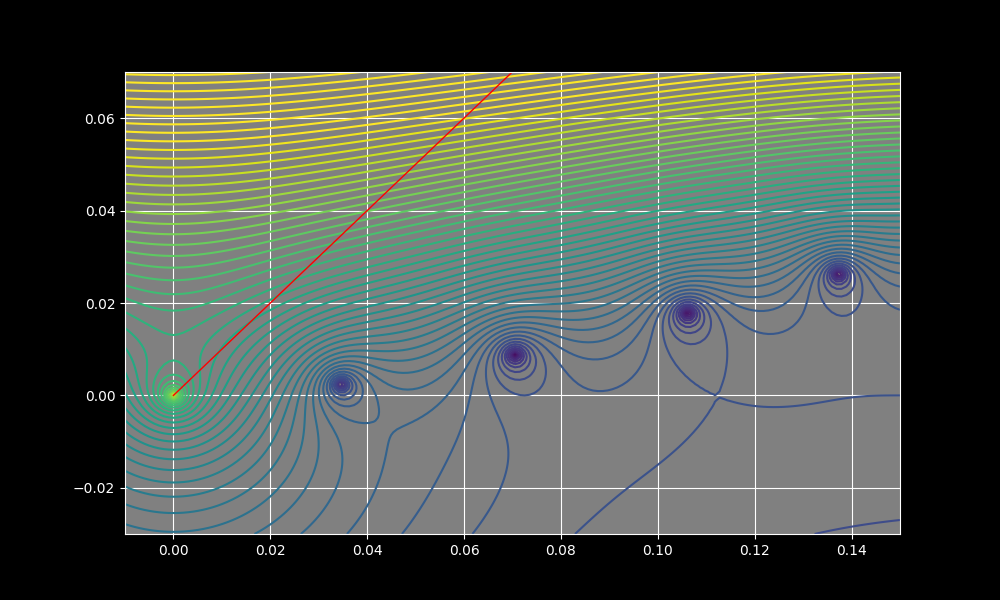

In [7]:
D.animate_propagation_constants(-.01, .15, -.03, .07, wlmin=minwl, wlmax=maxwl, Nwl=Nwl, fps=fps,
                                levels=60, rref=160, iref=160, color_min=-3, color_max=9, dpi=300)

In [31]:
from IPython.display import HTML

HTML("""
<video controls id="theVideo">
        <source src="prop_const_animation.mp4">
</video>

<script>
video = document.getElementById("theVideo")
video.width = 1000;
video.playbackRate = 1;
</script>
""")


In [62]:
# Video('prop_const_animation.mp4', width=1100, html_attributes="controls")
